# Exploring Bangkok Neighborhoods
### Best Area to open fast food restaurant around office area in Bangkok Downtown
## Table of Content
1. Introduction<br/>
2. Data
3. Methodology
4. Result
5. Discussion
6. Conclusion

Import necessary library

In [1]:
import pandas as pd
import folium
import numpy as np
import requests
import matplotlib.pyplot as pyplot
import seaborn as sns
from bs4 import BeautifulSoup as bs

%matplotlib inline

## Introduction

Bangkok is the most population in Thailand, not just Thai people live in there but foreigner are also coming for travel, work and live here. For Thai people Bangkok is the most expensive living expenses and highest income city in Thailand that makes Bangkok be a central of businesses and economics of Thailand. 

During the daytime, people who work in Bangkok must seeking for breakfast and lunch while the traffics is too heavy and time limit, the fast food near their office area must be a great choice. There are so many offices and restaurants in Bangkok downtown, but the place I have work before have no restaurant nearby, we have to work about 100-150 meter to find some restaurant, and when we arrived there, they have no enough seat for us, so we have to wait for other customer finish their meal, bill, and exit the restaurant and then we got a seat. That became to this idea.

This analysis must fit to anyone who looking for a place to open restaurant in downtown of Bangkok, or office man who available to make a lunch box or some sandwich to sell in your office, this is a good opportunity to start food business.

## Data

First grab a Bangkok district location

In [2]:
r = requests.get("https://en.wikipedia.org/wiki/List_of_districts_of_Bangkok") 
soup = bs(r.content, "html.parser")
html_data = soup.find_all("table", {"class": "wikitable sortable"})
pc_df = pd.read_html(str(html_data[0]))[0]
pc_df.head(5)

,District(Khet),MapNr,Post-code,Thai,Popu-lation,No. ofSubdis-trictsKhwaeng,Latitude,Longitude
0,Bang Bon,50,10150,บางบอน,105161,4,13.659200,100.399100
1,Bang Kapi,6,10240,บางกะปิ,148465,2,13.765833,100.647778
2,Bang Khae,40,10160,บางแค,191781,4,13.696111,100.409444
3,Bang Khen,5,10220,บางเขน,189539,2,13.873889,100.596389
4,Bang Kho Laem,31,10120,บางคอแหลม,94956,3,13.693333,100.502500


To make it more easy to query I will rename column District(Khet) to District.

In [3]:
pc_df.rename(columns={"District(Khet)": "District", "Popu-lation":"Population"}, inplace=True)

pc_df.head()

,District,MapNr,Post-code,Thai,Population,No. ofSubdis-trictsKhwaeng,Latitude,Longitude
0,Bang Bon,50,10150,บางบอน,105161,4,13.659200,100.399100
1,Bang Kapi,6,10240,บางกะปิ,148465,2,13.765833,100.647778
2,Bang Khae,40,10160,บางแค,191781,4,13.696111,100.409444
3,Bang Khen,5,10220,บางเขน,189539,2,13.873889,100.596389
4,Bang Kho Laem,31,10120,บางคอแหลม,94956,3,13.693333,100.502500


Then, We will need to get an office location from Foursquare<br/>
but Foursquare is returning only 100 recommended places in each query so we need to create co-ordinates area from the Downtown of Bangkok

In [4]:
gg_api_key = #"Your Google Map API KEY"
fsq_client_id = #"Your foursquare client ID"
fsq_client_secret = #"your foursquare secret key"

Preparing a location distance calculation function.

In [5]:
import shapely.geometry
import pyproj
import math

def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=47, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=47, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

The Bangkok Business area are around Siam, Asoke, Silom So in those location is in Pathum Wan District so I will explore it from Pathum Wan District and finding for office around 6KM radius from Prathumwan District

In [6]:
pathumwan_ll = [13.744942, 100.5222]
bkk_geo = r'./data/adm2_greaterBK_hD4.json'

bkkmap = folium.Map(location=pathumwan_ll, zoom_start=12)
bkkmap.choropleth(
    geo_data=bkk_geo,
    data=pc_df,
    columns=["District", "Population"],
    key_on='feature.properties.NAME_2',
    fill_color='YlGn',
    legend_name='Bangkoks District Population',
    fill_opacity = 0.7,
    line_opacity=0.2
)
folium.Circle(
        pathumwan_ll,
        radius=6000,
        #radius=5,
        color='blue',
        fill=False,
        fill_color='#3186cc',
        fill_opacity=0.9,
        parse_html=False).add_to(bkkmap) 

bkkmap

As I told Foursquare data will return only 100 places but there're so many office in bangkok so, I should create a co-ordinate area in 300m each inside a circle that show you

In [7]:
pathumwan_ll_x, pathumwan_ll_y = lonlat_to_xy(pathumwan_ll[1], pathumwan_ll[0]) # City center in Cartesian coordinates

k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_min = pathumwan_ll_x - 6000
x_step = 600
y_min = pathumwan_ll_y - 6000 - (int(21/k)*k*600 - 12000)/2
y_step = 600 * k 

latitudes = []
longitudes = []
distances_from_center = []
xs = []
ys = []
for i in range(0, int(21/k)):
    y = y_min + i * y_step
    x_offset = 300 if i%2==0 else 0
    for j in range(0, 21):
        x = x_min + j * x_step + x_offset
        distance_from_center = calc_xy_distance(pathumwan_ll_x, pathumwan_ll_y, x, y)
        if (distance_from_center <= 6001):
            lon, lat = xy_to_lonlat(x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_center.append(distance_from_center)
            xs.append(x)
            ys.append(y)

print(len(latitudes), 'co-ordinate generated.')

364 co-ordinate generated.


In [8]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=12)
folium.Marker(pathumwan_ll, popup='Bangkok').add_to(map_bkk)
map_bkk.choropleth(
    geo_data=bkk_geo,
    data=pc_df,
    columns=["District", "Population"],
    key_on='feature.properties.NAME_2',
    fill_color='YlGn',
    legend_name='Bangkoks District Population',
    fill_opacity = 0.7,
    line_opacity=0.2
)
for lat, lon in zip(latitudes, longitudes):
    folium.Circle([lat, lon], radius=300, color='blue', fill=False).add_to(map_bkk)
map_bkk

After we create a co-ordinate, next we will get an offices and restaurants location data in each circle.<br/>
So, in Foursquare<br/>
Office category is 4bf58dd8d48988d124941735 <br/>
Food category is 4d4b7105d754a06374d81259 <br/>
and our target Fast Food category is 4bf58dd8d48988d16e941735

In [9]:
office_cate = '4bf58dd8d48988d124941735'
food_cate = '4d4b7105d754a06374d81259'
fast_food_cate = '4bf58dd8d48988d16e941735'

In [10]:
df_coor_loc = pd.DataFrame({"lat":latitudes, "lng":longitudes, "distance":distances_from_center})

df_coor_loc.reset_index(inplace=True)

In [11]:
df_coor_loc.rename(columns={"index": "Area_Id"}, inplace=True)
df_coor_loc.head()

,Area_Id,lat,lng,distance
0,0,13.693379,100.505227,5992.495307
1,1,13.693345,100.510773,5840.376700
2,2,13.693311,100.516320,5747.173218
3,3,13.693277,100.521867,5715.767665
4,4,13.693243,100.527414,5747.173218


Preparing for Geocoder function to translate lat and lon to an address.

In [12]:
import pickle

def get_address(api_key, latitude, longitude, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&latlng={},{}'.format(api_key, latitude, longitude)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        address = results[0]['formatted_address']
        return address
    except:
        return None

coor_address_tp = []
    
    
try:
    with open('cood_area_address.pkl', 'rb') as f:
        df_coor_loc = pickle.load(f)
    loaded = True
except:
    pass

if not loaded:
    for area_id, lat, lng, distance in zip(df_coor_loc["Area_Id"], df_coor_loc["lat"], df_coor_loc["lng"], df_coor_loc["distance"]):
        address = get_address(gg_api_key, lat, lng)
        coor_address_tp.append((area_id, lat, lng, distance, address))

    df_coor_loc = pd.DataFrame(data=coor_address_tp, columns=["Area_Id", "lat", "lng", "distance", "address"])

    with open('cood_area_address.pkl', 'wb') as f:
        pickle.dump(df_coor_loc, f)



So After we prepared area to search, then shell we start and get a office location in each area

In [13]:
def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def get_venues_near_location(lat, lon, category, client_id, client_secret, radius=500, limit=100):
    version = '20180724'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lon, category, radius, limit)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        venues = [(item['venue']['id'],
                   item['venue']['name'],
                   get_categories(item['venue']['categories']),
                   (item['venue']['location']['lat'], item['venue']['location']['lng']),
                   ', '.join(item['venue']['location']['formattedAddress']),
                   item['venue']['location']['distance']) for item in results]      
    except:
        venues = []
    return venues

def get_offices(a_ids, lats, lons, office_category, foursquare_client_id, foursquare_client_secret):
    offices_info = {}
    offices_info_by_area = {}
    print('Obtaining venues around location:')
    for a_id, lat, lon in zip(a_ids, lats, lons):
        venues = get_venues_near_location(lat, lon, office_category, foursquare_client_id, foursquare_client_secret, radius=350, limit=100)
        area_office_info = []
        for venue in venues:
            v_id = venue[0]
            v_name = venue[1]
            v_categories = venue[2]
            v_latlon = venue[3]
            v_address = venue[4]
            v_distance = venue[5]
            x, y = lonlat_to_xy(v_latlon[1], v_latlon[0])
            office = (v_id, v_name, v_latlon[0], v_latlon[1], v_address, v_distance, x, y)
            offices_info[v_id] = office
            if v_distance<=300:
                area_office_info.append(office)
        offices_info_by_area[a_id] = area_office_info
        print("Area ID : {} get {} locations".format(a_id, len(venues)))
    print("Fetch Complete")
    return offices_info, offices_info_by_area

In [14]:
offices_list = {}
offices_list_area = {}
loaded = False

try:
    with open('offices_list.pkl', 'rb') as f:
        offices_list = pickle.load(f)
    with open('offices_list_area.pkl', 'rb') as f:
        offices_list_area = pickle.load(f)
    loaded = True
except:
    pass

if not loaded:
    offices_list, offices_list_area = get_offices(df_coor_loc["Area_Id"], df_coor_loc["lat"], df_coor_loc["lng"], office_cate, fsq_client_id, fsq_client_secret)
    
    with open('offices_list.pkl', 'wb') as f:
        pickle.dump(offices_list, f)
    with open('offices_list_area.pkl', 'wb') as f:
        pickle.dump(offices_list_area, f)
        

In [15]:
len(offices_list)

3043

In [16]:
area_office_list = []
for area_id, offices in offices_list_area.items():
    for office in offices:
        area_office_list.append((area_id, office[0], office[1], office[2], office[3], office[4], office[5], office[6], office[7]))

af_df = pd.DataFrame(data=area_office_list, columns=["area_id","office_id","name","latitude","longitude","address","distance_from_center", "x","y"])


In [17]:
af_df.head()

,area_id,office_id,name,latitude,longitude,address,distance_from_center,x,y
0,0,4f0418a62c5b145d091ed88b,"Sense Sign Co., Ltd.",13.692510,100.504815,"หมู่บ้านภักดี, ประเทศไทย",106,662736.577243,1.514226e+06
1,0,4d0585e97d9ba35d1ec26b23,Leo Global Logistics,13.691528,100.503740,"Rama 3, บางคอแหลม, กรุงเทพมหานคร, ประเทศไทย",261,662621.049947,1.514117e+06
2,1,4c58db292fa89c74416e1323,ยูนิคอร์ท อพาร์ทเม้นท์ l Unicourt Apartment,13.693900,100.509109,"Soi Pradoo 31 (Charoenkrung), บางคอแหลม, กรุงเ...",190,663200.174159,1.514382e+06
3,2,4d6da0c2792bb60c077157be,"Bangkok Rubber Public Co.,Ltd. (Main Offices)",13.692990,100.517441,"611/40 Soi Wat Chan Nai, บางโคล่, กรุงเทพมหานค...",126,664101.986345,1.514287e+06
4,2,4b4ed124f964a520e2f526e3,Bangkok Rubber Public Company Limited (Factory),13.693015,100.517465,"611/40 Soi Watchan Nai (Charoen Krung Rd.), บา...",128,664104.525361,1.514290e+06


Then we will get a location of restaurant and plot it together with office

In [18]:
def is_restaurant(categories, specific_filter=None):
    restaurant_words = ['restaurant', 'steakhouse', 'diner', 'court']
    restaurant = False
    specific = False
    for c in categories:
        category_name = c[0].lower()
        category_id = c[1]
        for r in restaurant_words:
            if r in category_name:
                restaurant = True
        if not(specific_filter is None) and (category_id in specific_filter):
            specific = True
            restaurant = True
    return restaurant, specific

def get_restaurants(a_ids, lats, lons, food_category, foursquare_client_id, foursquare_client_secret):
    restaurants = {}
    fast_food_restaurants = {}
    location_restaurants = []

    print('Obtaining restaurant around locations:')
    for a_id, lat, lon in zip(a_ids, lats, lons):
        venues = get_venues_near_location(lat, lon, food_category, foursquare_client_id, 
                                          foursquare_client_secret, radius=350, limit=100)
        area_restaurants = []
        for venue in venues:
            v_id = venue[0]
            v_name = venue[1]
            v_categories = venue[2]
            v_latlon = venue[3]
            v_address = venue[4]
            v_distance = venue[5]
            is_res, is_fastfood = is_restaurant(v_categories, specific_filter=["4bf58dd8d48988d16e941735"])
            if is_res:
                x, y = lonlat_to_xy(v_latlon[1], v_latlon[0])
                restaurant = (a_id, v_id , v_name, v_latlon[0], v_latlon[1], v_address, v_distance, is_fastfood, x, y)
                if v_distance<=300:
                    area_restaurants.append(restaurant)
                restaurants[v_id] = restaurant
                if is_fastfood:
                    fast_food_restaurants[v_id] = restaurant
        location_restaurants.append(area_restaurants)
        print("Area ID : {} get {} locations".format(a_id, len(venues)))
    print('Fetch Complete.')
    return restaurants, fast_food_restaurants, location_restaurants

In [19]:
restaurants = {}
fastfood_restaurants = {}
location_restaurants = []
loaded = False
try:
    with open('restaurants.pkl', 'rb') as f:
        restaurants = pickle.load(f)
    with open('fastfood_restaurants.pkl', 'rb') as f:
        fastfood_restaurants = pickle.load(f)
    with open('location_restaurants.pkl', 'rb') as f:
        location_restaurants = pickle.load(f)
    print('Restaurant data loaded.')
    loaded = True
except:
    pass

# If load failed use the Foursquare API to get the data
if not loaded:
    restaurants, fastfood_restaurants, location_restaurants = get_restaurants(df_coor_loc["Area_Id"], 
                                                                              df_coor_loc["lat"], 
                                                                              df_coor_loc["lng"], 
                                                                              food_cate, 
                                                                              fsq_client_id, 
                                                                              fsq_client_secret)
    
    # Let's persists this in local file system
    with open('restaurants.pkl', 'wb') as f:
        pickle.dump(restaurants, f)
    with open('fastfood_restaurants.pkl', 'wb') as f:
        pickle.dump(fastfood_restaurants, f)
    with open('location_restaurants.pkl', 'wb') as f:
        pickle.dump(location_restaurants, f)

Restaurant data loaded.


In [20]:
location_restaurants_list = []
for location_restaurant in location_restaurants:
    for res in location_restaurant:
        location_restaurants_list.append((res[0],res[1],res[2],res[3],res[4],res[5],res[6],res[7],res[8],res[9]))

In [21]:
ar_df = pd.DataFrame(data=location_restaurants_list, columns=["area_id","restaurant_id","name","latitude","longitude","address","distance_from_center", "is_fastfood", "x","y"])

In [22]:
ar_df.head()

,area_id,restaurant_id,name,latitude,longitude,address,distance_from_center,is_fastfood,x,y
0,0,4bb725b62f70c9b69e528630,ห้องอาหารจันทร์เพ็ญ,13.692355,100.504234,"255 Rama III Rd, พระนคร, กรุงเทพมหานคร 10120, ...",156,False,662673.840451,1.514208e+06
1,0,4cba853f43ec6dcba136a531,ต้าหลง,13.691038,100.504261,"Future Mart Rama 3, บางคอแหลม, กรุงเทพมหานคร 1...",280,False,662677.750739,1.514063e+06
2,0,4f0d88b4e4b0254b4cd23fee,ร้านอาหารตามสั่ง,13.693756,100.505535,"เจริญกรุง107 แยก25, ประเทศไทย",53,False,662813.683916,1.514364e+06
3,0,4dc0e4adae60533f34e5fc2c,ก๋วยเตี๋ยวหลอด-เปาะเปี๊ยะสด,13.694684,100.504767,"บางโคล่, กรุงเทพมหานคร, ประเทศไทย",153,False,662729.884246,1.514466e+06
4,0,4d58ec56fe7c224b2c1772b5,กวางตุ้งโภชนา,13.693792,100.505392,"3597/36 (แฉล้มนิมิตร), บางโคล่, กรุงเทพมหานคร ...",49,False,662798.093295,1.514368e+06


Plot data of Offices and Restaurants together in map.

In [23]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)
folium.Marker(pathumwan_ll, popup='Pathum Wan').add_to(map_bkk)

for res in restaurants.values():
    lat = res[3]; lon = res[4]
    is_fastfood = res[7]
    color = 'red' if is_fastfood else 'green'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_bkk)
    
for ofc in offices_list.values():
    lat = ofc[2]; lon = ofc[3]
    color = 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_bkk)
    
map_bkk


See the plot we catch so many restaurant and office let's analyse it.

## Methodology
<br/>
For this project the data is relate with <b>Restaurant</b> and <b>Office</b><br/><br/>
So we should compare in each area to find out which area have less restaurant but have more office

First make data frame of counting offices and restaurant in each area

In [24]:
comp_off_area = af_df[["area_id","office_id"]].groupby("area_id").agg({"office_id":["count"]})
comp_res_area = ar_df[["area_id","restaurant_id"]].groupby("area_id").agg({"restaurant_id":["count"]})

In [25]:
comp_off_area.columns = ["office_count"]
comp_off_area.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 290 entries, 0 to 363
Data columns (total 1 columns):
office_count    290 non-null int64
dtypes: int64(1)
memory usage: 4.5 KB


In [26]:
comp_res_area.columns = ["restaurant_count"]
comp_res_area.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 333 entries, 0 to 363
Data columns (total 1 columns):
restaurant_count    333 non-null int64
dtypes: int64(1)
memory usage: 5.2 KB


In [27]:
comp_area = comp_off_area.join(comp_res_area)

In [28]:
comp_area.reset_index(inplace=True)

In [29]:
comp_area.head()

,area_id,office_count,restaurant_count
0,0,2,7.0
1,1,1,4.0
2,2,8,1.0
3,3,2,2.0
4,5,2,1.0


Before doing analysis of a good area to open restaurant we having too many offices and restaurant that we have plotted in figure 3, I will finding for area that having less restaurant in that coordinate area with 3:1 ratio (3 offices per 1 restaurant)

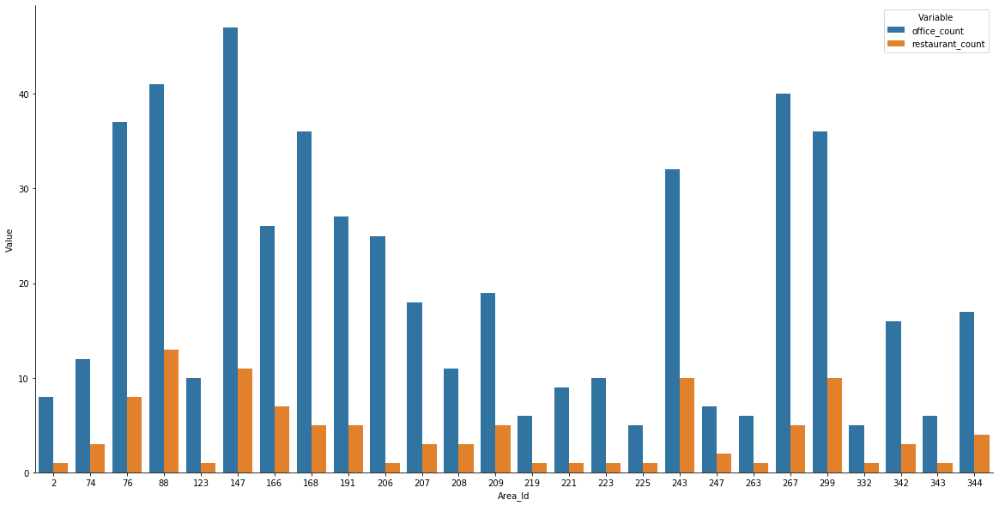

In [30]:
fig, ax1 = pyplot.subplots(figsize=(20, 10))
#Focusing on area that have 
tidy = comp_area[comp_area["office_count"]/3 > comp_area["restaurant_count"]].melt(id_vars='area_id').rename(columns=str.title)
sns.barplot(x='Area_Id', y='Value', hue='Variable', data=tidy, ax=ax1)
sns.despine(fig)

I got a focused area already in bar chart we see in those area have too less restaurant in area (300 meters radius). Plot those focused area into a map and see what we get.

In [32]:
from folium import plugins
from folium.plugins import HeatMap

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

restaurant_latlons = [[res[3], res[4]] for res in restaurants.values()]
office_latlons = [[lat, lng] for lat, lng in zip(af_df["latitude"], af_df["longitude"])]

map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_bkk)
folium.Marker(pathumwan_ll).add_to(map_bkk)

for area_id in comp_area[comp_area["office_count"]/3 > comp_area["restaurant_count"]]["area_id"]:
    folium.Circle([df_coor_loc.loc[df_coor_loc["Area_Id"]==area_id]["lat"][area_id], df_coor_loc.loc[df_coor_loc["Area_Id"]==area_id]["lng"][area_id]], radius=300, fill=False, color='green').add_to(map_bkk)

folium.GeoJson(bkk_geo, style_function=boroughs_style, name='geojson').add_to(map_bkk)
map_bkk

Create data frame of offices in each area.

In [33]:
focused_area = comp_area[comp_area["office_count"]/3 > comp_area["restaurant_count"]]

In [34]:
offices_in_focused_area = af_df.loc[af_df["area_id"].isin(focused_area["area_id"])]
offices_in_focused_area.head()

,area_id,office_id,name,latitude,longitude,address,distance_from_center,x,y
3,2,4d6da0c2792bb60c077157be,"Bangkok Rubber Public Co.,Ltd. (Main Offices)",13.692990,100.517441,"611/40 Soi Wat Chan Nai, บางโคล่, กรุงเทพมหานค...",126,664101.986345,1.514287e+06
4,2,4b4ed124f964a520e2f526e3,Bangkok Rubber Public Company Limited (Factory),13.693015,100.517465,"611/40 Soi Watchan Nai (Charoen Krung Rd.), บา...",128,664104.525361,1.514290e+06
5,2,4cc154e321a4f04d134d6355,บริษัท ไทยวาโก้ จำกัด (มหาชน),13.691929,100.514856,"930/1 ซ.ประดู่ (สาธุประดิษฐ์), บางโคล่, กรุงเท...",220,663823.065856,1.514168e+06
6,2,4d27dea2ebacb1f73bd5eb4f,Pan Group BKK Service Section,13.693055,100.518613,ประเทศไทย,249,664228.715915,1.514295e+06
7,2,4d5508b0b4deb1f791c0ff79,บ.ภัทยาอุตสาหกิจ จำกัด,13.691891,100.518162,"บางโคล่, กรุงเทพมหานคร, ประเทศไทย",254,664180.713559,1.514166e+06


Create function to count restaurant nearby offices in focused area

In [35]:
#Finding near restaurant in redius 100 meters around office in focused area
def count_restaurants_nearby(x, y, restaurants, radius=100):    
    count = 0
    for res in restaurants.values():
        res_x = res[8]; res_y = res[9]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

def find_nearest_restaurant(x, y, restaurants):
    d_min = 100000
    for res in restaurants.values():
        res_x = res[8]; res_y = res[9]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=d_min:
            d_min = d
    return d_min

In [36]:
restaurant_near_office_counts = []
restaurant_near_office_distances = []
fastfood_restaurant_near_office_distance = []

print('Generating data on focused office location... ', end='')
for x, y in zip(offices_in_focused_area["x"], offices_in_focused_area["y"]):
    count = count_restaurants_nearby(x, y, restaurants, radius=100)
    restaurant_near_office_counts.append(count)
    distance = find_nearest_restaurant(x, y, restaurants)
    ff_distance = find_nearest_restaurant(x, y, fastfood_restaurants)
    restaurant_near_office_distances.append(distance)
print('done.')

Generating data on focused office location... done.


Then integrate data into data frame.

In [37]:
restaurant_near_office_df = offices_in_focused_area[:]

In [38]:
restaurant_near_office_df["restaurant_count"] = restaurant_near_office_counts

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [39]:
restaurant_near_office_df["distance_to_nearest_restaurant"] = restaurant_near_office_distances

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


Check Dataframe contain offices data and restaurant in 100 meters radius from each offices

In [40]:
restaurant_near_office_df.head()

,area_id,office_id,name,latitude,longitude,address,distance_from_center,x,y,restaurant_count,distance_to_nearest_restaurant
3,2,4d6da0c2792bb60c077157be,"Bangkok Rubber Public Co.,Ltd. (Main Offices)",13.692990,100.517441,"611/40 Soi Wat Chan Nai, บางโคล่, กรุงเทพมหานค...",126,664101.986345,1.514287e+06,0,292.142642
4,2,4b4ed124f964a520e2f526e3,Bangkok Rubber Public Company Limited (Factory),13.693015,100.517465,"611/40 Soi Watchan Nai (Charoen Krung Rd.), บา...",128,664104.525361,1.514290e+06,0,294.145793
5,2,4cc154e321a4f04d134d6355,บริษัท ไทยวาโก้ จำกัด (มหาชน),13.691929,100.514856,"930/1 ซ.ประดู่ (สาธุประดิษฐ์), บางโคล่, กรุงเท...",220,663823.065856,1.514168e+06,0,173.379624
6,2,4d27dea2ebacb1f73bd5eb4f,Pan Group BKK Service Section,13.693055,100.518613,ประเทศไทย,249,664228.715915,1.514295e+06,0,398.028512
7,2,4d5508b0b4deb1f791c0ff79,บ.ภัทยาอุตสาหกิจ จำกัด,13.691891,100.518162,"บางโคล่, กรุงเทพมหานคร, ประเทศไทย",254,664180.713559,1.514166e+06,0,405.583981


In [41]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)

for lat,lng in zip(restaurant_near_office_df["latitude"],restaurant_near_office_df["longitude"]):
    folium.Circle([lat, lng], radius=100, fill=False, color='blue').add_to(map_bkk)


for res in restaurants.values():
    lat = res[3]; lon = res[4]
    is_fastfood = res[7]
    color = 'red' if is_fastfood else 'green'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_bkk)
    

map_bkk


As we see in above map, there’re many offices in those area but they not have close enough restaurant to offices that will make a lack of seat in restaurant. After analysis let filter out office that have restaurant within 100 meters radius.

In [42]:
offices_with_no_res = restaurant_near_office_df[restaurant_near_office_df["restaurant_count"]==0]
print("Offices with no restaurant :", offices_with_no_res["office_id"].count())

Offices with no restaurant : 222


Let's plot a dataframe that contain data of offices that no restaurant nearby.

In [43]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)

for lat,lng in zip(offices_with_no_res["latitude"],offices_with_no_res["longitude"]):
    folium.CircleMarker([lat, lng], radius=2, fill=True, color='blue').add_to(map_bkk)

res_lat_lon = []
for res in restaurants.values():
    lat = res[3]; lon = res[4]
    res_lat_lon.append([lat, lon])
    
HeatMap(res_lat_lon).add_to(map_bkk)

map_bkk

Next step when we filtered out we will get a group of office that not have restaurant nearby we will use clustering to group those offices and then plot a cluster in 100 meters radius from center of cluster into map.

In [44]:
from sklearn.cluster import KMeans

def cluster_data(data, number_of_cluster = 50):
    good_xys = offices_with_no_res[["x","y"]]
    kmeans = KMeans(n_clusters=number_of_cluster, random_state=0).fit(good_xys)
    cluster_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in kmeans.cluster_centers_]
    return kmeans, cluster_centers

In [45]:
kmeans, cluster_centers = cluster_data(data=offices_with_no_res, number_of_cluster = 50)

map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_bkk)
HeatMap(res_lat_lon).add_to(map_bkk)

for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=100, color='green', fill=True, fill_opacity=0.25).add_to(map_bkk) 

for lat, lon in zip(offices_with_no_res["latitude"], offices_with_no_res["longitude"]):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_bkk)

folium.GeoJson(bkk_geo, style_function=boroughs_style, name='geojson').add_to(map_bkk)

map_bkk


In [46]:
def count_offices_nearby(x, y, offices_location, radius=100):    
    count = 0
    for res_x, res_y in zip(offices_location["x"], offices_location["y"]):
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

offices_counts = []

print('Generating data to count office in cluster... ', end='')
for cc in kmeans.cluster_centers_:
    count = count_offices_nearby(cc[0], cc[1], offices_with_no_res, radius=100)
    offices_counts.append(count)
print('done.')

Generating data to count office in cluster... done.


In [47]:
cluster_df = pd.DataFrame(data=cluster_centers, columns=["cluster_lng", "cluster_lat"])

In [48]:
cluster_df["office_count"] = offices_counts

After clustering we have calculate offices in each cluster and check with 3:1 ratio.

In [49]:
cluster_count = list(filter(lambda x: x >=3 , offices_counts))
len(cluster_count)

23

In [50]:
filtered_cluster = cluster_df[cluster_df["office_count"]>=3]

Plot a cluster that contain 3 or more offices only

In [51]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_bkk)
HeatMap(res_lat_lon).add_to(map_bkk)

for lat, lon in zip(filtered_cluster["cluster_lat"], filtered_cluster["cluster_lng"]):
    folium.Circle([lat, lon], radius=100, color='green', fill=True, fill_opacity=0.25).add_to(map_bkk) 

for lat, lon in zip(offices_with_no_res["latitude"], offices_with_no_res["longitude"]):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_bkk)

folium.GeoJson(bkk_geo, style_function=boroughs_style, name='geojson').add_to(map_bkk)

map_bkk

Let's optimize a cluster to find the best maximum cluster number

In [70]:
maximum_number_of_clusters = int(offices_with_no_res["office_id"].count()/3)
print("As ratio of office and restaurant will be Maximum cluster :" ,maximum_number_of_clusters)

As ratio of office and restaurant will be Maximum cluster : 74


In [82]:
from statistics import mean
list_of_cluster_count = []

for noc in range(50, maximum_number_of_clusters + 1):
    kmeans, cluster_centers = cluster_data(data=offices_with_no_res, number_of_cluster = noc)
    offices_counts = []
    for cc in kmeans.cluster_centers_:
        count = count_offices_nearby(cc[0], cc[1], offices_with_no_res, radius=100)
        offices_counts.append(count)
    
    filtered_offices_in_cluster = list(filter(lambda x: x >= 3 , offices_counts))
    filtered_offices_in_cluster.sort(reverse=True)
    avg_offices_in_cluster = mean(filtered_offices_in_cluster[0:10])
    list_of_cluster_count.append((noc, avg_offices_in_cluster))
    
list_of_cluster_count_df = pd.DataFrame(data=list_of_cluster_count, columns=["Number of cluster", "Average offices in cluster"])

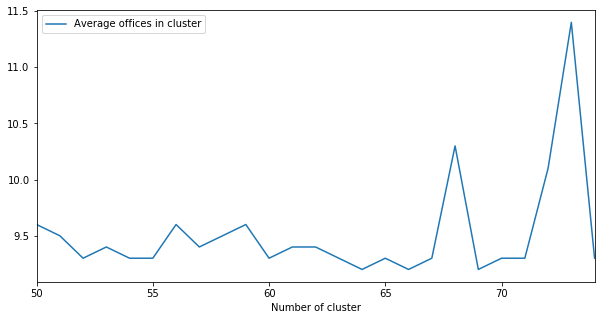

In [83]:
list_of_cluster_count_df.plot(kind="line", y="Average offices in cluster", x="Number of cluster", figsize=(10,5))

In [109]:
list_of_cluster_count_df.iloc[list_of_cluster_count_df['Average offices in cluster'].idxmax()]

Number of cluster             73.0
Average offices in cluster    11.4
Name: 23, dtype: float64

We get 73 as the best maximum cluster number. So we will perform a clustering again.

In [110]:
kmeans, cluster_centers = cluster_data(data=offices_with_no_res, number_of_cluster = 73)

offices_counts = []

print('Generating data to count office in cluster... ', end='')
for cc in kmeans.cluster_centers_:
    count = count_offices_nearby(cc[0], cc[1], offices_with_no_res, radius=100)
    offices_counts.append(count)

cluster_df = pd.DataFrame(data=cluster_centers, columns=["cluster_lng", "cluster_lat"])
cluster_df["office_count"] = offices_counts
cluster_count = list(filter(lambda x: x >=3 , offices_counts))
filtered_cluster = cluster_df[cluster_df["office_count"]>=3]

Generating data to count office in cluster... 

In [111]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_bkk)
HeatMap(res_lat_lon).add_to(map_bkk)

for lat, lon in zip(filtered_cluster["cluster_lat"], filtered_cluster["cluster_lng"]):
    folium.Circle([lat, lon], radius=100, color='green', fill=True, fill_opacity=0.25).add_to(map_bkk) 

for lat, lon in zip(offices_with_no_res["latitude"], offices_with_no_res["longitude"]):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_bkk)

folium.GeoJson(bkk_geo, style_function=boroughs_style, name='geojson').add_to(map_bkk)

map_bkk

## Result

After perform a clustering model that we used we get 10 areas to open restaurant, in each area having 100 meters radius from center of cluster (marker). Let’s explore what we get.

In [112]:
# Top 10
top_10_area = filtered_cluster.sort_values(by='office_count', ascending=False).head(10)

In [113]:
print(top_10_area)

    cluster_lng  cluster_lat  office_count
56   100.548328    13.749271            19
9    100.547846    13.748808            17
12   100.554279    13.740679            17
59   100.554905    13.740572            17
69   100.571626    13.763197             9
5    100.570922    13.762128             8
21   100.540181    13.758348             8
65   100.548238    13.747805             7
25   100.567800    13.764579             6
61   100.558149    13.715481             6


Getting an address from lat & lng

In [114]:
cluster_address = []

for lat,lng in zip(top_10_area["cluster_lat"], top_10_area["cluster_lng"]) :
    cluster_address.append(get_address(api_key=gg_api_key, latitude=lat, longitude=lng))

In [115]:
top_10_area.reset_index(inplace=True)

In [116]:
top_10_area.rename(columns={"index":"cluster_no"}, inplace=True)

Text(0, 0.5, 'Office Count')

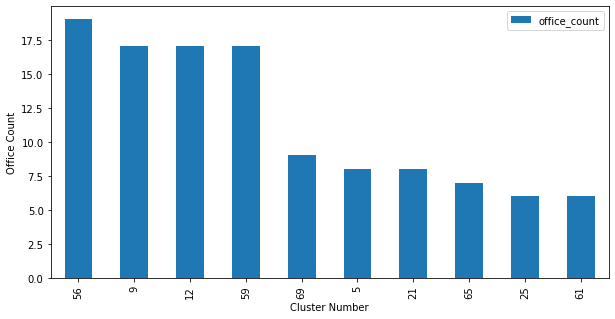

In [117]:
ax = top_10_area.plot.bar(x="cluster_no", y="office_count", figsize=(10,5))
ax.set_xlabel("Cluster Number")
ax.set_ylabel("Office Count")

In [118]:
top_10_area["cluster_address"] = cluster_address
top_10_area

,cluster_no,cluster_lng,cluster_lat,office_count,cluster_address
0,56,100.548328,13.749271,19,"1126/1-2 Phetchaburi Rd, Khwaeng Makkasan, Khe..."
1,9,100.547846,13.748808,17,"1126/2 อาคารวานิช ชั้น 4, เพชรบุรีตัดใหม่, แขว..."
2,12,100.554279,13.740679,17,"140 Sukhumvit Rd, Khwaeng Khlong Toei, Khet Kh..."
3,59,100.554905,13.740572,17,"212/22, อาคารสุขุมวิทพลาซ่า ชั้น1, ถนนสุขุมวิท..."
4,69,100.571626,13.763197,9,"63/1 Thanon Walthana Tham, Khwaeng Huai Khwang..."
5,5,100.570922,13.762128,8,"63/1 พระรม 9 Khwaeng Huai Khwang, Khet Huai Kh..."
6,21,100.540181,13.758348,8,"Bangkok Thai Tower, Khwaeng Thanon Phaya Thai,..."
7,65,100.548238,13.747805,7,"57/6-7, ถนนวิทยุ, แขวงลุมพินี เขตปทุมวัน กรุงเ..."
8,25,100.567800,13.764579,6,"Unnamed Road, Khwaeng Din Daeng, Khet Din Daen..."
9,61,100.558149,13.715481,6,"10 Na Ranong Rd, Khwaeng Khlong Toei, Khet Khl..."


And then because language that I got from Google is Thai language so I will translate it and push it back into Dataframe

In [120]:
top_10_area["cluster_address"][1]

'1126/2 อาคารวานิช ชั้น 4, เพชรบุรีตัดใหม่, แขวงมักกะสัน เขตราชเทวี กรุงเทพมหานคร, 10400 Khwaeng Makkasan, Khet Ratchathewi, Krung Thep Maha Nakhon 10400, Thailand'

In [121]:
top_10_area["cluster_address"][1] = '1126/2 Wanich Bld. 4th Floor, New Petchburi Rd., Khwaeng Makkasan, Khet Ratchathewi, Krung Thep Maha Nakhon 10400, Thailand'


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [123]:
top_10_area["cluster_address"][3]

'212/22, อาคารสุขุมวิทพลาซ่า ชั้น1, ถนนสุขุมวิท แขวง คลองเตย เขตคลองเตย กรุงเทพมหานคร 10110, Thailand'

In [124]:
top_10_area["cluster_address"][3] = '212/22, Sukhumvit Plz. 1st Floor, Sukhumvit Rd., Kwhaeng Klongtoey, Khet Klongtoey, Krung Thep Maha Nakhon 10110, Thailand'


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [126]:
top_10_area["cluster_address"][7]

'57/6-7, ถนนวิทยุ, แขวงลุมพินี เขตปทุมวัน กรุงเทพมหานคร, 10330 Khwaeng Lumphini, Khet Pathum Wan, Krung Thep Maha Nakhon 10330, Thailand'

In [127]:
top_10_area["cluster_address"][7] = '57/6-7, Wireless Rd., Khwaeng Lumphini, Khet Pathum Wan, Krung Thep Maha Nakhon 10330, Thailand'

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [129]:
top_10_area["cluster_address"][5]

'63/1 พระรม 9 Khwaeng Huai Khwang, Khet Huai Khwang, Krung Thep Maha Nakhon 10310, Thailand'

In [130]:
top_10_area["cluster_address"][5] = '63/1, Rama 9 Rd, Khwaeng Huai Khwang, Khet Huai Khwang, Krung Thep Maha Nakhon 10310, Thailand'

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


So let plot data that I've translated already.

In [132]:
map_bkk = folium.Map(location=pathumwan_ll, zoom_start=14)

for lat, lon in zip(offices_with_no_res["latitude"], offices_with_no_res["longitude"]):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_bkk)

for cls_no, lat, lon, addr in zip(top_10_area["cluster_no"], top_10_area["cluster_lat"], top_10_area["cluster_lng"], top_10_area["cluster_address"]):
    folium.Marker([lat, lon], popup="Cluster No. {} : {}".format(cls_no, addr)).add_to(map_bkk)
    folium.Circle([lat, lon], radius=100, color='#0000ff00', fill=True, fill_color='green', fill_opacity=0.20).add_to(map_bkk)
    
folium.GeoJson(bkk_geo, style_function=boroughs_style, name='geojson').add_to(map_bkk)

map_bkk

## Discussion

First, I was show there are many office and restaurant in Bangkok downtown area (from center of Pathumwan District until 6 kilometers radius) that I can catch from Foursquare API with create an area to get restaurant and office around each area because of limit of Foursquare API that returning with top 100 recommended place. After I get all of the places needed, I calculated a number of offices and restaurant in each area to find focusing area to do analysis to reduce unnecessary area to put more restaurant because they already have much more restaurant in there. So, I’ve set ratio for this analysis at 3 offices per 1 restaurant, it means if that area has 4 offices but only 1 restaurant then that will be our focused area. Then I made counting restaurant for each office within 100 meters radius from office and count and filter the office that having restaurant in 100 meters radius out from analysis so, that I will catch offices that have no restaurant nearby. Next step I group offices together with K-Mean clustering using center of cluster as center of office’s group and then count an office in cluster area. The first try with 50 cluster is not good enough because there’re many groups of offices are out of cluster so I try to make the best cluster model wishing to get most average office in cluster for top 10 that contain the most offices in there. After I get the best number of clusters, I go to cluster again with that number of cluster and get top 10 area that contain most office in there.

## Conclusion

The purpose for this project is finding the best place to open restaurant around offices area that mean this project will find a group of offices that doesn’t have restaurant nearby. By calculating and analysis the offices and restaurant data, reducing it with condition and clustering it until we get the top 10 best area to open a restaurant
<br/><br/>
But the final decision for an optimal location will be made by stakeholder based on offices size in cluster that we made, a characteristic of office man who work there, taking into consideration additional factors, etc., also if you aim to get more customer that not work around there you should define the place to put your restaurant based on proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood
